In [1]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Counting objects: 100% (435/435), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 740 (delta 416), reused 380 (delta 380), pack-reused 305 (from 1)
Receiving objects: 100% (740/740), 97.48 MiB | 14.79 MiB/s, done.
Resolving deltas: 100% (499/499), done.


In [2]:
%cd TACO
!python3 download.py

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished


In [3]:
%cd ..

/content


In [4]:
import os

# Check the number of batch folders downloaded
data_path = 'TACO/data/'
batches = [folder for folder in os.listdir(data_path) if folder.startswith('batch_')]
print(f"Total number of batches: {len(batches)}")

Total number of batches: 15


In [5]:
import json
import os

# Path to the annotations file
annotations_path = 'TACO/data/annotations.json'

# Check if the annotations file exists
if os.path.exists(annotations_path):
    with open(annotations_path, 'r') as f:
        data = json.load(f)

    # Get the number of images, categories, and annotations
    num_images = len(data['images'])  # List of images
    num_categories = len(data['categories'])  # List of categories
    num_annotations = len(data['annotations'])  # List of annotations

    print(f"Number of images: {num_images}")
    print(f"Number of categories: {num_categories}")
    print(f"Number of annotations: {num_annotations}")
else:
    print(f"Annotations file not found at: {annotations_path}")


Number of images: 1500
Number of categories: 60
Number of annotations: 4784


In [6]:
import json

# Load the annotations file
with open('TACO/data/annotations.json') as f:
    data = json.load(f)

In [7]:
import json
import os
import cv2
import matplotlib.pyplot as plt

# Load the annotations file
with open(annotations_path) as f:
    annotations = json.load(f)

# Create dictionaries for images and annotations
images_dict = {img['id']: img for img in annotations['images']}
annotations_dict = {ann['image_id']: [] for ann in annotations['annotations']}
for ann in annotations['annotations']:
    annotations_dict[ann['image_id']].append(ann)

In [8]:
import os
import cv2
import matplotlib.pyplot as plt

# Extract categories and annotations from the JSON data
categories = {cat['id']: cat['name'] for cat in data['categories']}
annotations = data['annotations']
images = {img['id']: img for img in data['images']}

def show_image_with_boxes(image_id):
    # Find the corresponding image info
    image_info = images.get(image_id)
    if not image_info:
        print(f"Image ID {image_id} not found in the dataset.")
        return

    # Construct the correct image path
    image_path = os.path.join(data_path, image_info['file_name'])

    # Check if the image exists
    if not os.path.exists(image_path):
        print(f"Could not find image at: {image_path}")
        return

    # Read the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not load image: {image_path}")
        return

    # Convert the image from BGR (OpenCV format) to RGB (for display in matplotlib)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter annotations for this image
    image_annotations = [ann for ann in annotations if ann['image_id'] == image_info['id']]

    # Draw bounding boxes and category labels on the image
    for ann in image_annotations:
        # Get bbox coordinates (x, y, width, height)
        x, y, width, height = map(int, ann['bbox'])  # Convert to integers
        category_id = ann['category_id']
        category_name = categories[category_id]

        # Draw the bounding box (green color, thickness=2)
        cv2.rectangle(image, (x, y), (x + width, y + height), (0, 255, 0), 2)

        # Add the category label in red above the bounding box
        label = f"{category_name}"
        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

    # Display the image with bounding boxes and category labels using matplotlib
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')  # Hide axes for better visualization
    plt.show()


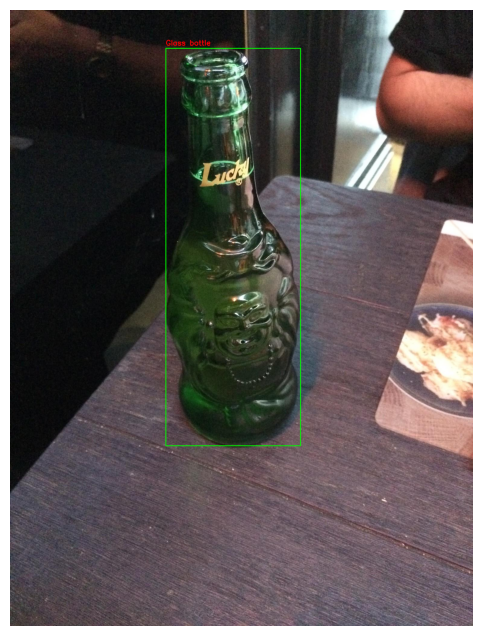

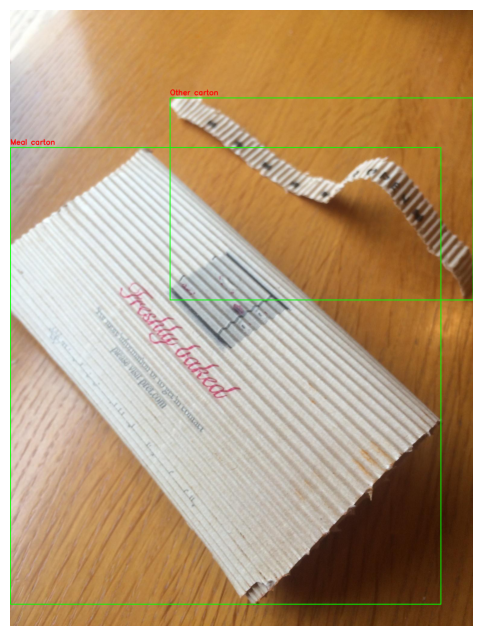

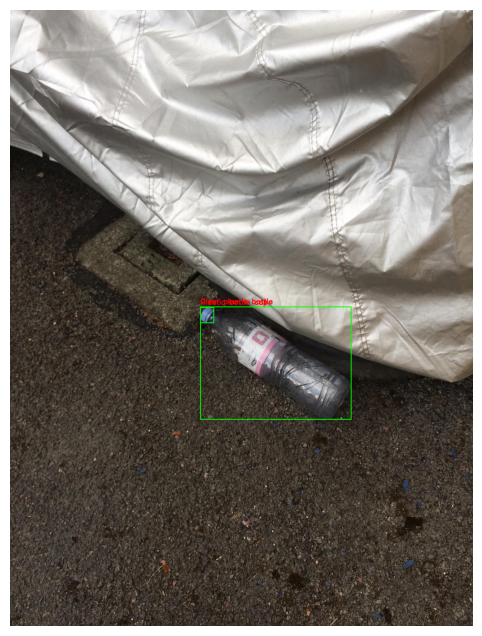

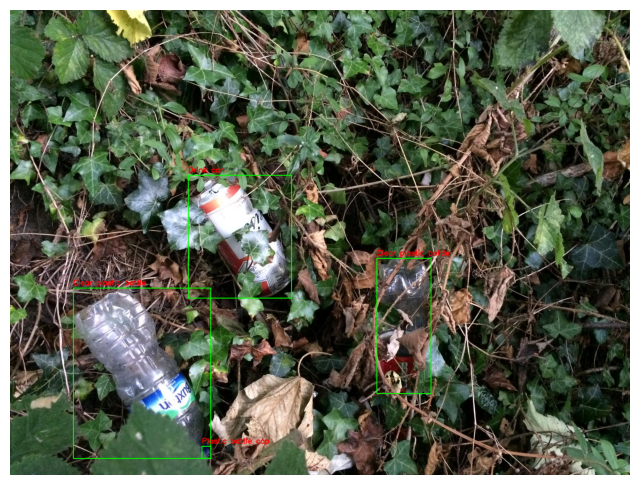

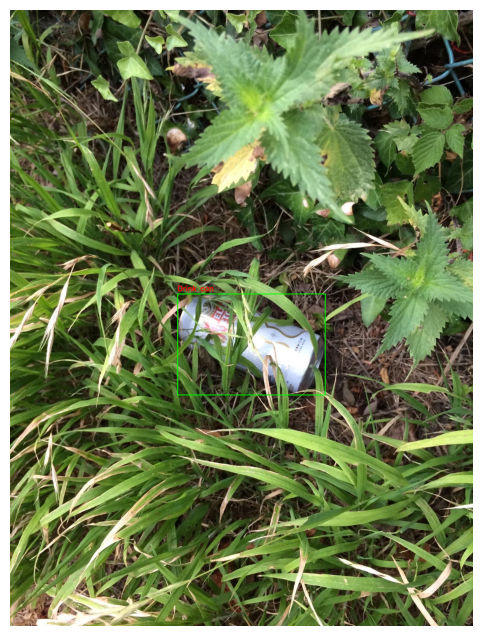

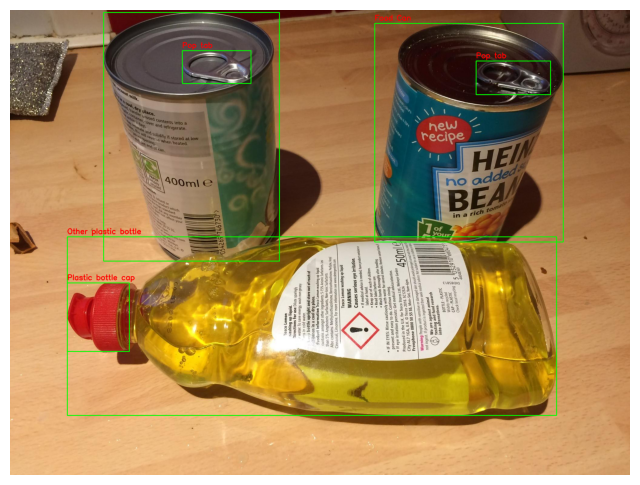

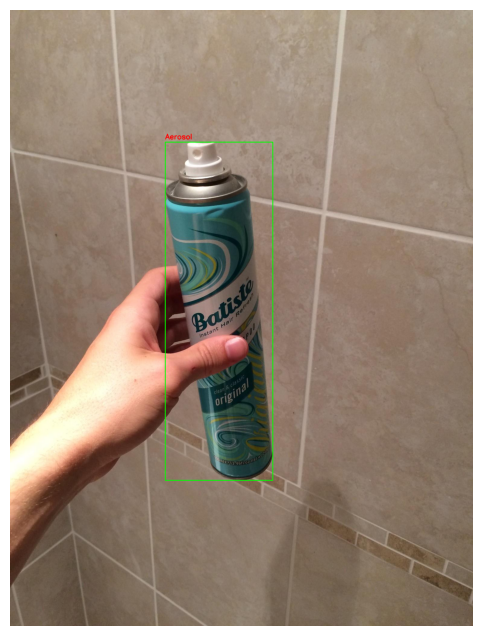

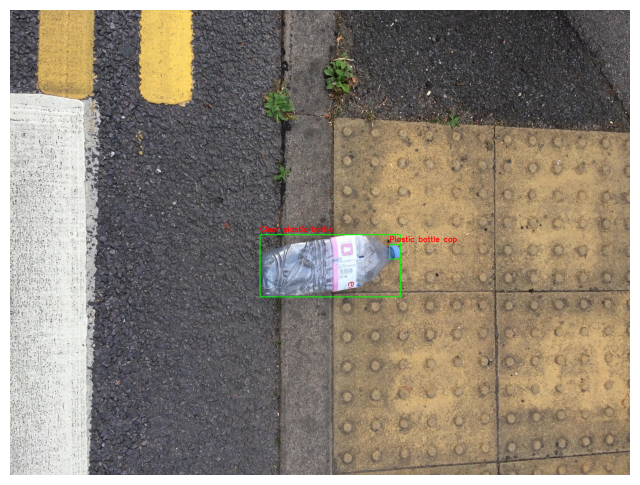

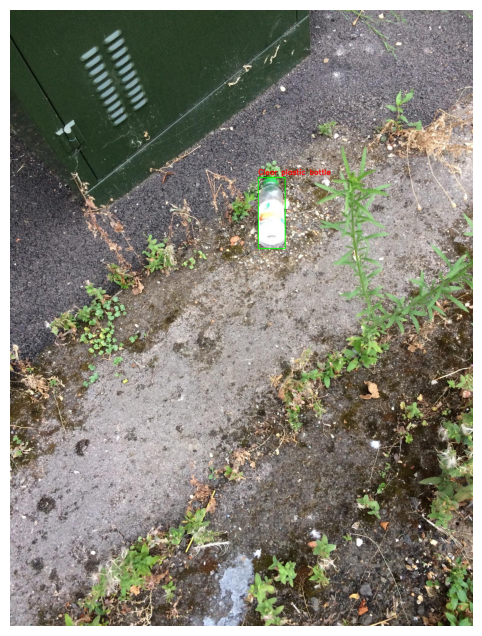

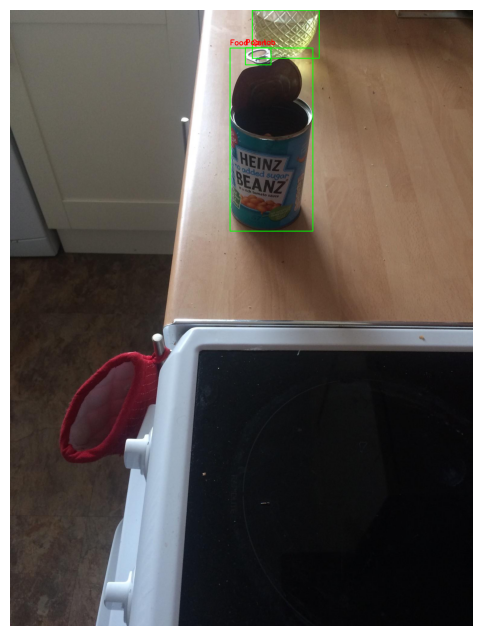

In [9]:
# Show the first 10 images with bounding boxes and category labels
for i in range(10):
    show_image_with_boxes(i)

In [10]:
# Extract categories from the annotations data
categories = data.get('categories', [])

# Create a dictionary to store supercategories and their corresponding categories
supercategory_dict = {}

# Iterate over categories to group them by supercategory
for category in categories:
    supercategory = category.get('supercategory', 'Uncategorized')  # Default to 'Uncategorized' if no supercategory
    category_name = category.get('name', 'Unknown Category')

    # Add the category under the corresponding supercategory
    if supercategory not in supercategory_dict:
        supercategory_dict[supercategory] = []
    supercategory_dict[supercategory].append(category_name)

# Now print each supercategory and its categories
for supercategory, category_list in supercategory_dict.items():
    print(f"Supercategory: {supercategory}")
    for category in category_list:
        print(f" - {category}")
    print()  # Add an empty line for readability


Supercategory: Aluminium foil
 - Aluminium foil

Supercategory: Battery
 - Battery

Supercategory: Blister pack
 - Aluminium blister pack
 - Carded blister pack

Supercategory: Bottle
 - Other plastic bottle
 - Clear plastic bottle
 - Glass bottle

Supercategory: Bottle cap
 - Plastic bottle cap
 - Metal bottle cap

Supercategory: Broken glass
 - Broken glass

Supercategory: Can
 - Food Can
 - Aerosol
 - Drink can

Supercategory: Carton
 - Toilet tube
 - Other carton
 - Egg carton
 - Drink carton
 - Corrugated carton
 - Meal carton
 - Pizza box

Supercategory: Cup
 - Paper cup
 - Disposable plastic cup
 - Foam cup
 - Glass cup
 - Other plastic cup

Supercategory: Food waste
 - Food waste

Supercategory: Glass jar
 - Glass jar

Supercategory: Lid
 - Plastic lid
 - Metal lid

Supercategory: Other plastic
 - Other plastic

Supercategory: Paper
 - Magazine paper
 - Tissues
 - Wrapping paper
 - Normal paper

Supercategory: Paper bag
 - Paper bag
 - Plastified paper bag

Supercategory: Plast

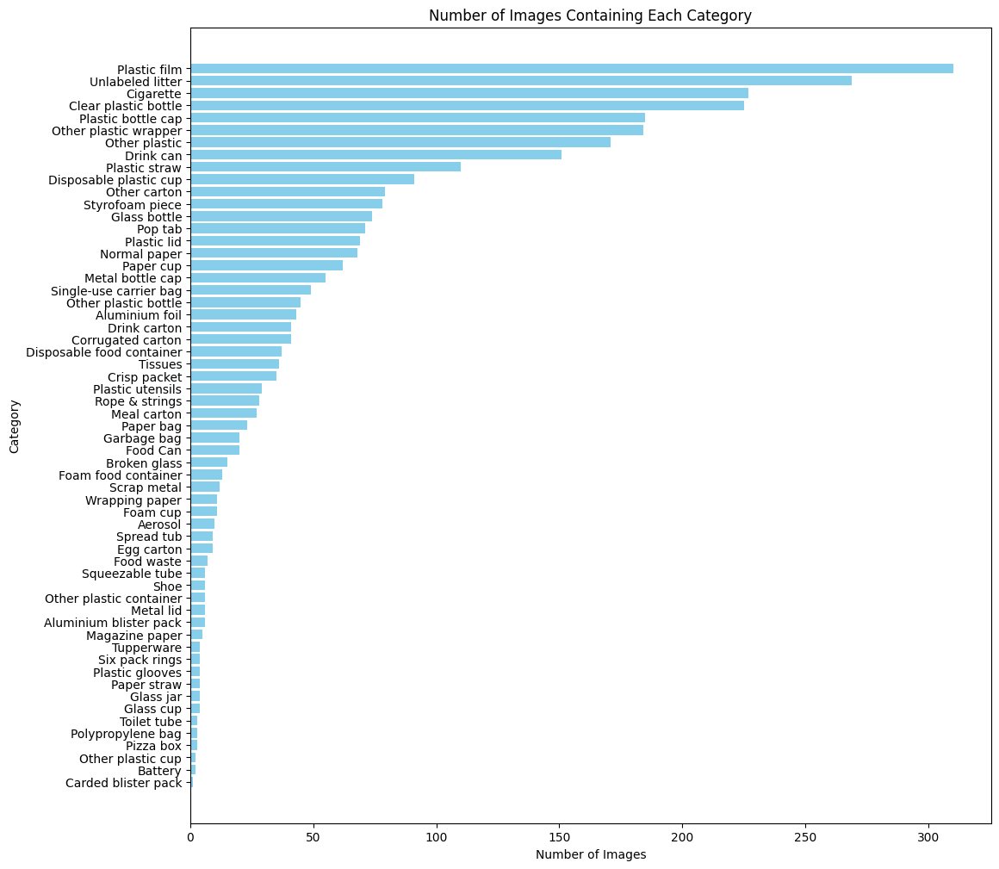

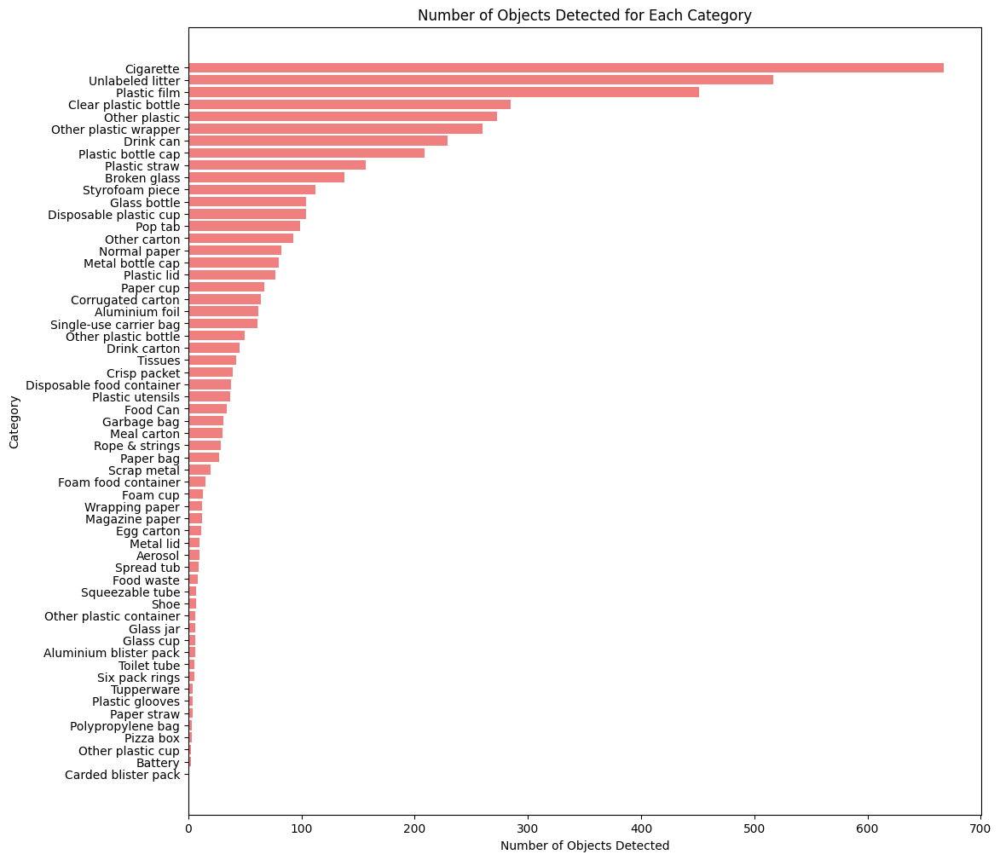

In [11]:
from collections import defaultdict

# Extract the annotations and categories
annotations = data.get('annotations', [])
categories = data.get('categories', [])

# Create a mapping for category ids to names
category_id_to_name = {category['id']: category['name'] for category in categories}

# Create dictionaries to count images per category and objects per category
image_count_per_category = defaultdict(set)  # Uses a set to avoid counting the same image multiple times
object_count_per_category = defaultdict(int)

# Initialize total counts for calculating mean objects per image
total_objects = 0
unique_images = set()

# Iterate through annotations
for annotation in annotations:
    image_id = annotation['image_id']
    category_id = annotation['category_id']

    # Update the image count for the category (one image may contain multiple categories)
    image_count_per_category[category_id].add(image_id)

    # Update the object count for the category
    object_count_per_category[category_id] += 1

    # Update total objects and images
    total_objects += 1

    # Add image_id to the set of unique images
    unique_images.add(image_id)

# Convert image counts from sets to actual counts
image_count_per_category = {cat_id: len(images) for cat_id, images in image_count_per_category.items()}

# Convert category ids to category names for easier plotting
category_names = [category_id_to_name[cat_id] for cat_id in image_count_per_category.keys()]
image_counts = list(image_count_per_category.values())

# The total number of unique images
total_images = len(unique_images)

# Sort categories by number of images (descending order)
sorted_image_counts, sorted_category_names = zip(*sorted(zip(image_counts, category_names), reverse=False))

# Plot the histogram of number of images containing each category (sorted)
plt.figure(figsize=(12, 12))
plt.barh(sorted_category_names, sorted_image_counts, color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Category')
plt.title('Number of Images Containing Each Category')
plt.show()

# Sort categories by number of objects (descending order)
object_counts = [object_count_per_category[cat_id] for cat_id in image_count_per_category.keys()]
sorted_object_counts, sorted_category_names_objects = zip(*sorted(zip(object_counts, category_names), reverse=False))

# Plot the histogram of number of objects detected for each category (sorted)
plt.figure(figsize=(12, 12))
plt.barh(sorted_category_names_objects, sorted_object_counts, color='lightcoral')
plt.xlabel('Number of Objects Detected')
plt.ylabel('Category')
plt.title('Number of Objects Detected for Each Category')
plt.show()


In [12]:
# Calculate mean number of objects per image
mean_objects_per_image = round(total_objects / total_images, 2) if total_images != 0 else 0
print(f'Mean number of objects per image: {mean_objects_per_image}')

Mean number of objects per image: 3.19


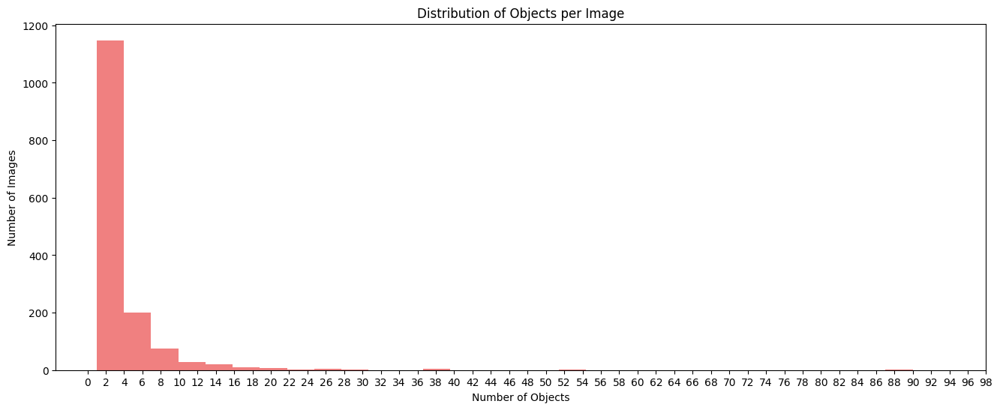

In [13]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Calculate object count per image
image_object_counts = defaultdict(int)

for ann in data['annotations']:
    image_object_counts[ann['image_id']] += 1

# Get a list of object counts per image
object_counts_per_image = list(image_object_counts.values())

# Plot distribution of object counts per image
plt.figure(figsize=(16, 6))
plt.hist(object_counts_per_image, bins=30, color='lightcoral')

# Set x-axis ticks with an increment of 5
max_x = plt.gca().get_xlim()[1]  # Get the current maximum x-value
plt.xticks(range(0, int(max_x) + 5, 2))  # Set x-ticks with an increment of 5

plt.title("Distribution of Objects per Image")
plt.xlabel("Number of Objects")
plt.ylabel("Number of Images")
plt.show()

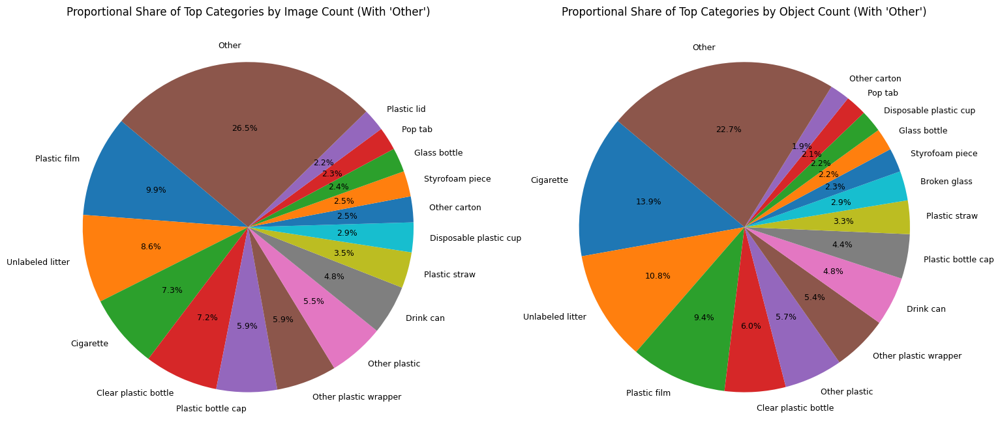

In [15]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Assuming `object_count_per_category`, `image_count_per_category`, and `category_id_to_name` are defined as before

# Set the number of top categories to display
top_n = 15

# Sort and select the top categories for objects
sorted_object_counts = sorted(object_count_per_category.items(), key=lambda x: x[1], reverse=True)
top_object_categories = sorted_object_counts[:top_n]
other_object_categories = sorted_object_counts[top_n:]

# Sort and select the top categories for images
sorted_image_counts = sorted(image_count_per_category.items(), key=lambda x: x[1], reverse=True)
top_image_categories = sorted_image_counts[:top_n]
other_image_categories = sorted_image_counts[top_n:]

# Prepare data for top categories and 'Other' aggregation for images
top_image_category_names = [category_id_to_name[cat_id] for cat_id, _ in top_image_categories] + ["Other"]
top_image_category_counts = [count for _, count in top_image_categories]
top_image_category_counts.append(sum(count for _, count in other_image_categories))

# Prepare data for top categories and 'Other' aggregation for objects
top_object_category_names = [category_id_to_name[cat_id] for cat_id, _ in top_object_categories] + ["Other"]
top_object_category_counts = [count for _, count in top_object_categories]
top_object_category_counts.append(sum(count for _, count in other_object_categories))

# Calculate proportional shares
total_images = sum(top_image_category_counts)
proportional_shares_images = [(count / total_images) * 100 for count in top_image_category_counts]

total_objects = sum(top_object_category_counts)
proportional_shares_objects = [(count / total_objects) * 100 for count in top_object_category_counts]

# Plotting side-by-side pie charts with images on the left and objects on the right
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

# Pie chart for image counts
ax1.pie(proportional_shares_images, labels=top_image_category_names, autopct='%1.1f%%', startangle=140, textprops={'fontsize': 9})
ax1.set_title("Proportional Share of Top Categories by Image Count (With 'Other')")

# Pie chart for object counts
ax2.pie(proportional_shares_objects, labels=top_object_category_names, autopct='%1.1f%%', startangle=140, textprops={'fontsize': 9})
ax2.set_title("Proportional Share of Top Categories by Object Count (With 'Other')")

plt.show()


## Converting Data into YOLO format

In [16]:
import json
import os
from pathlib import Path
import shutil

# Paths to your TACO dataset
coco_json_path = 'TACO/data/annotations.json'  # Path to TACO's annotations file
images_dir = 'TACO/data'                       # Path to TACO's main image directory with batch subfolders
output_dir = 'yolo_top_categories'             # Base directory for YOLO format

# Ensure output directories for images and labels
Path(output_dir, 'images').mkdir(parents=True, exist_ok=True)
Path(output_dir, 'labels').mkdir(parents=True, exist_ok=True)

# Load TACO annotations
with open(coco_json_path, 'r') as f:
    data = json.load(f)

# Get category mappings
categories = {category['id']: category['name'] for category in data['categories']}

# Counter for unique filenames
file_counter = 1

# Process each image and corresponding annotations
for img in data['images']:
    img_id = img['id']
    img_file_name = img['file_name']  # This should be in the format 'batch_x/filename.jpg'
    img_width, img_height = img['width'], img['height']

    # Derive the image path within one of the 15 batch folders
    img_path = os.path.join(images_dir, img_file_name)

    # Create a unique integer-based name for each image and label
    unique_name = str(file_counter)
    img_extension = os.path.splitext(img_file_name)[1]  # Preserve the original extension (e.g., .jpg, .png)

    # Copy image to the images directory with the new unique name
    output_image_path = os.path.join(output_dir, 'images', unique_name + img_extension)
    if os.path.exists(img_path):
        shutil.copy(img_path, output_image_path)

        # Create a corresponding label file with the same unique integer name
        label_file_path = os.path.join(output_dir, 'labels', unique_name + '.txt')
        with open(label_file_path, 'w') as label_file:
            # Find all annotations for the current image
            for ann in data['annotations']:
                if ann['image_id'] == img_id:
                    category_id = ann['category_id']
                    # Ensure the category is in our mapping
                    if category_id in categories:
                        # YOLO format requires x_center, y_center, width, and height normalized
                        x, y, width, height = ann['bbox']
                        x_center = (x + width / 2) / img_width
                        y_center = (y + height / 2) / img_height
                        width /= img_width
                        height /= img_height

                        # Write the label file in YOLO format: <class_id> <x_center> <y_center> <width> <height>
                        label_file.write(f"{category_id} {x_center} {y_center} {width} {height}\n")

        # Increment the counter for the next file
        file_counter += 1

# Print the total number of images moved
print(f"Total number of images processed: {file_counter - 1}")

Total number of images processed: 1500


## Deleting Unwanted Categories and Updating Existing Ones

In [17]:
import os
import json

# Step 1: Define the category mapping for the categories of interest
desired_categories = {
    36: 0,  # Plastic film
    58: 1,  # Unlabeled litter
    59: 2,  # Cigarette
    5: 3,   # Clear plastic bottle
    7: 4,   # Plastic bottle cap
    39: 5,  # Other plastic wrapper
    29: 6,  # Other plastic
    12: 7   # Drink can
}

# Step 2: Define path to annotations and labels directory

label_dir = 'yolo_top_categories/labels'

# Step 3: Initialize counters for total images and deleted images
total_images = len(data['images'])
deleted_image_ids = set()

# Step 4: Loop through annotations and filter out unwanted categories
for ann in data['annotations']:
    if ann['category_id'] not in desired_categories:
        deleted_image_ids.add(ann['image_id'])  # Mark images to be deleted

# Step 5: Update the label files to reflect only desired categories and new IDs
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Read the original label data
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

    # Prepare a list to hold the updated lines
    updated_lines = []

    # Process each line in the label file
    for line in lines:
        parts = line.strip().split()
        category_id = int(parts[0])

        # Check if the category ID is in the desired mapping
        if category_id in desired_categories:
            # Update the category ID to the new mapping
            new_category_id = desired_categories[category_id]

            # Create the updated line with the new category ID
            updated_line = f"{new_category_id} " + " ".join(parts[1:]) + "\n"
            updated_lines.append(updated_line)

    # Write the updated lines back to the label file
    with open(label_file_path, 'w') as file:
        file.writelines(updated_lines)

print("Label files have been updated with only the specified categories and new IDs.")

Label files have been updated with only the specified categories and new IDs.


## Deleting Files that Don't Contain Objects in the Categories of Interest

In [18]:
import os

# Path to the base directory containing unified 'images' and 'labels' folders
base_dir = 'yolo_top_categories'  # Adjust if necessary
label_dir = os.path.join(base_dir, 'labels')
image_dir = os.path.join(base_dir, 'images')

# Initialize a counter for deleted files
total_deleted_files = 0

# Loop over each label file in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Check if the label file is empty
    if os.path.getsize(label_file_path) == 0:
        # Construct possible image file paths
        base_image_name = os.path.splitext(label_file)[0]
        image_file_path_jpg = os.path.join(image_dir, base_image_name + '.jpg')
        image_file_path_jpg_upper = os.path.join(image_dir, base_image_name + '.JPG')

        # Delete the label file
        os.remove(label_file_path)
        total_deleted_files += 1

        # Delete the associated image file if it exists
        if os.path.exists(image_file_path_jpg):
            os.remove(image_file_path_jpg)
            total_deleted_files += 1
        elif os.path.exists(image_file_path_jpg_upper):
            os.remove(image_file_path_jpg_upper)
            total_deleted_files += 1

# Print the total number of files deleted
print(f"Total number of files deleted (label and image): {total_deleted_files}")

Total number of files deleted (label and image): 828


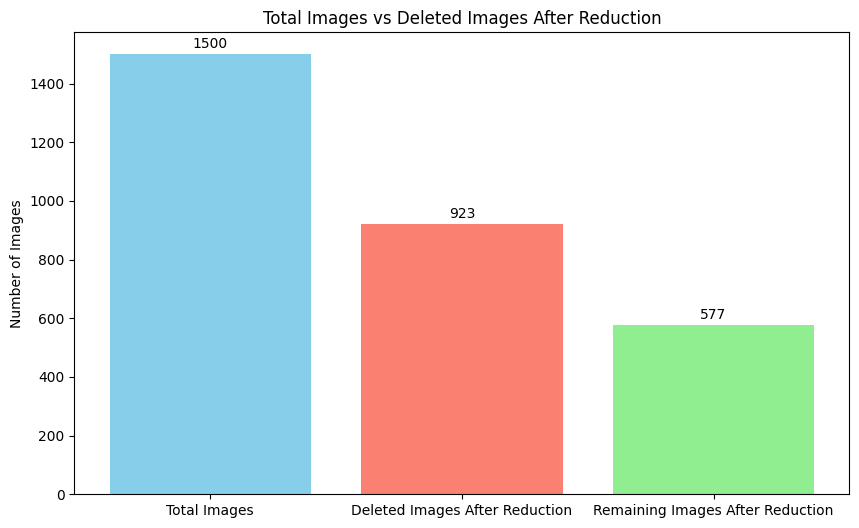

Total Images: 1500
Deleted Images After Reduction: 923
Remaining Images After Reduction: 577


In [19]:
import matplotlib.pyplot as plt

# Step 1: Calculate how many images are deleted based on category filtering
deleted_images_count = len(deleted_image_ids)
remaining_images_count = total_images - deleted_images_count

# Step 2: Plot the results using a bar chart
labels = ['Total Images', 'Deleted Images After Reduction', 'Remaining Images After Reduction']
counts = [total_images, deleted_images_count, remaining_images_count]

plt.figure(figsize=(10, 6))
bars = plt.bar(labels, counts, color=['skyblue', 'salmon', 'lightgreen'])

# Step 3: Display the number on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 10, int(yval), ha='center', va='bottom', fontsize=10)

# Step 4: Add labels and title to the plot
plt.ylabel("Number of Images")
plt.title("Total Images vs Deleted Images After Reduction")
plt.show()

# Step 5: Print the counts for verification
print(f"Total Images: {total_images}")
print(f"Deleted Images After Reduction: {deleted_images_count}")
print(f"Remaining Images After Reduction: {remaining_images_count}")

## Visualize the Counts of Object Labels in the Dataset

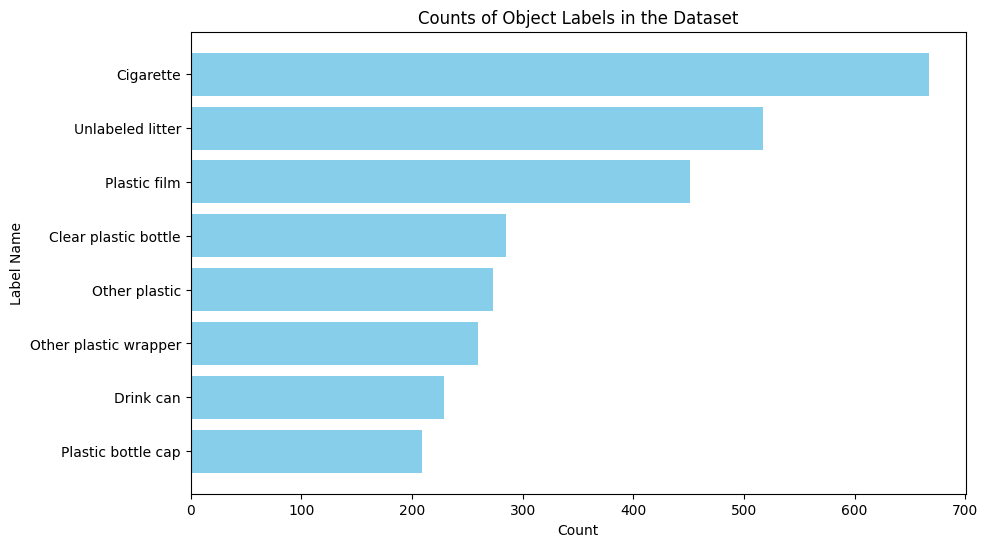

In [23]:
import os
import matplotlib.pyplot as plt
from collections import Counter

# Define a mapping from label IDs to names
label_names = {
    0: "Plastic film",
    1: "Unlabeled litter",
    2: "Cigarette",
    3: "Clear plastic bottle",
    4: "Plastic bottle cap",
    5: "Other plastic wrapper",
    6: "Other plastic",
    7: "Drink can"
}

# Initialize a counter for label counts across the entire dataset
label_counts = Counter()

# Loop over each label file in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Read the label file
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

        # Count each label in the file
        for line in lines:
            parts = line.strip().split()
            label_id = int(parts[0])  # The label ID is the first element
            label_counts[label_id] += 1

# Convert label IDs to label names and sort by count
labels, counts = zip(*sorted(
    [(label_names[label_id], count) for label_id, count in label_counts.items()],
    key=lambda x: x[1]
))

# Plotting a horizontal bar chart for the entire dataset
plt.figure(figsize=(10, 6))
plt.barh(labels, counts, color='skyblue')
plt.xlabel("Count")
plt.ylabel("Label Name")
plt.title("Counts of Object Labels in the Dataset")
plt.show()

In [22]:
import os

# Paths to the images and labels directories
image_dir = os.path.join(base_dir, 'images')
label_dir = os.path.join(base_dir, 'labels')

# Count the total number of images and labels
num_images = len([f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))])
num_labels = len([f for f in os.listdir(label_dir) if os.path.isfile(os.path.join(label_dir, f))])

print(f"Total number of images: {num_images}")
print(f"Total number of labels: {num_labels}")

Total number of images: 1086
Total number of labels: 1086


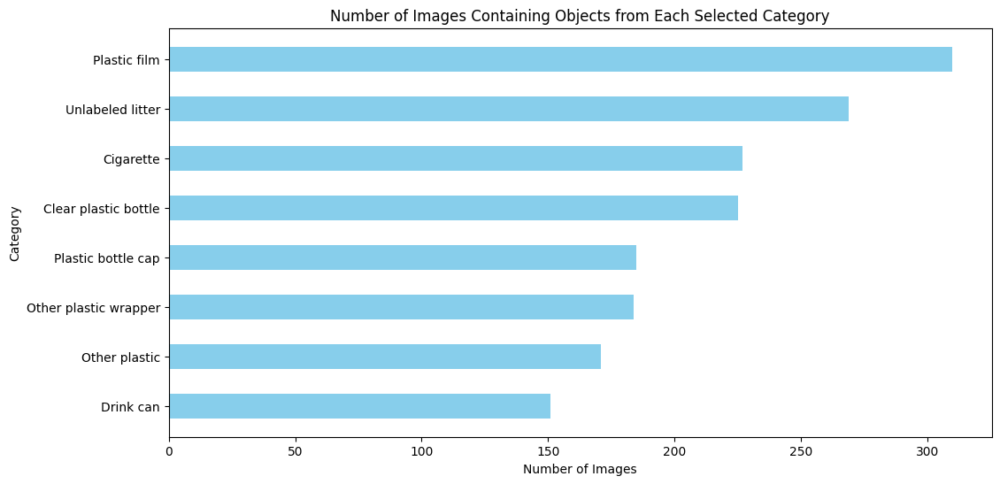

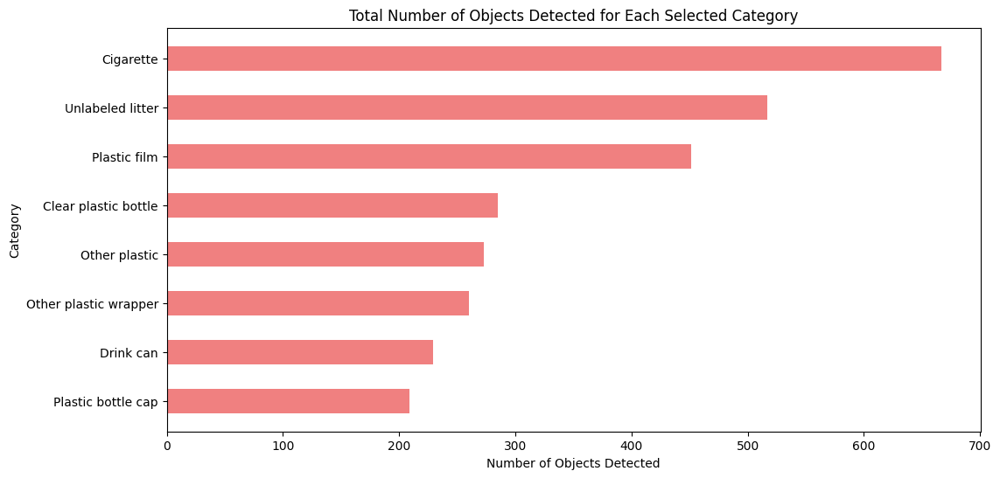

Category: Plastic film
Number of Images: 310
Number of Objects: 451
----------------------------------------
Category: Unlabeled litter
Number of Images: 269
Number of Objects: 517
----------------------------------------
Category: Cigarette
Number of Images: 227
Number of Objects: 667
----------------------------------------
Category: Clear plastic bottle
Number of Images: 225
Number of Objects: 285
----------------------------------------
Category: Plastic bottle cap
Number of Images: 185
Number of Objects: 209
----------------------------------------
Category: Other plastic wrapper
Number of Images: 184
Number of Objects: 260
----------------------------------------
Category: Other plastic
Number of Images: 171
Number of Objects: 273
----------------------------------------
Category: Drink can
Number of Images: 151
Number of Objects: 229
----------------------------------------


In [24]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Mapping of category IDs to category names based on your provided mapping
category_mapping = {
    36: "Plastic film",
    58: "Unlabeled litter",
    59: "Cigarette",
    5: "Clear plastic bottle",
    7: "Plastic bottle cap",
    39: "Other plastic wrapper",
    29: "Other plastic",
    12: "Drink can"
}

# Assuming you have your data loaded as 'data'
annotations = data.get('annotations', [])
categories = data.get('categories', [])

# Initialize dictionaries to count the number of unique images and the number of objects per category
image_count_per_category = defaultdict(set)  # Track unique images per category
object_count_per_category = defaultdict(int)  # Track total number of objects per category

# Process each annotation to count images and objects
for annotation in annotations:
    category_id = annotation['category_id']
    image_id = annotation['image_id']

    # Only process if the annotation's category is one of the selected categories
    if category_id in category_mapping:
        # Add the image to the set for this category (ensures unique images are counted)
        image_count_per_category[category_id].add(image_id)

        # Increment the count of objects for this category
        object_count_per_category[category_id] += 1

# Prepare the data for visualization
category_names = []
image_counts = []
object_counts = []

# Loop through the category mapping and fetch the counts
for category_id, category_name in category_mapping.items():
    category_names.append(category_name)
    image_counts.append(len(image_count_per_category[category_id]))  # Number of unique images with this category
    object_counts.append(object_count_per_category[category_id])  # Total number of objects for this category

# Sort categories by number of images (ascending order for plotting)
sorted_image_counts, sorted_category_names = zip(*sorted(zip(image_counts, category_names), reverse=False))
sorted_object_counts, sorted_category_names_objects = zip(*sorted(zip(object_counts, category_names), reverse=False))

# Plot the number of images containing objects from each selected category
plt.figure(figsize=(12, 6))
plt.barh(sorted_category_names, sorted_image_counts, color='skyblue', height=0.5)
plt.xlabel('Number of Images')
plt.ylabel('Category')
plt.title('Number of Images Containing Objects from Each Selected Category')
plt.show()

# Plot the total number of objects detected for each selected category
plt.figure(figsize=(12, 6))
plt.barh(sorted_category_names_objects, sorted_object_counts, color='lightcoral', height=0.5)
plt.xlabel('Number of Objects Detected')
plt.ylabel('Category')
plt.title('Total Number of Objects Detected for Each Selected Category')
plt.show()

# Optionally, print out the number of images and objects for each category
for category_id, category_name in category_mapping.items():
    print(f"Category: {category_name}")
    print(f"Number of Images: {len(image_count_per_category[category_id])}")
    print(f"Number of Objects: {object_count_per_category[category_id]}")
    print("-" * 40)


In [25]:
# Calculate the total number of objects and total number of images
total_objects = sum(object_counts)
total_images = sum(image_counts)

# Calculate the total mean number of objects per image across all categories
total_mean_objects_per_image = round(total_objects / total_images, 2) if total_images != 0 else 0

# Print the total mean number of objects per image
print(f'Total mean number of objects per image: {total_mean_objects_per_image}')


Total mean number of objects per image: 1.68


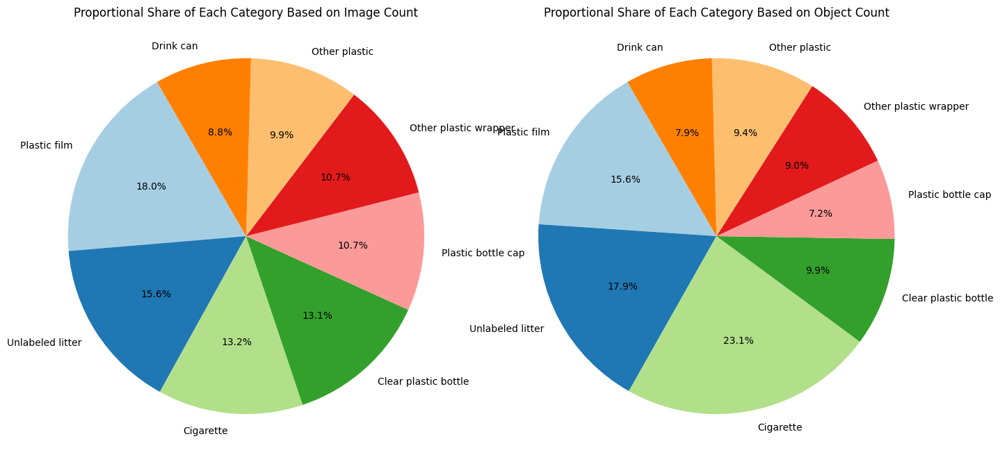

In [29]:
import matplotlib.pyplot as plt

# Create a figure with two subplots for side-by-side pie charts
plt.figure(figsize=(16, 8))

# Pie chart for objects per category
plt.subplot(1, 2, 1)
plt.pie(image_counts, labels=category_names, autopct='%1.1f%%', startangle=120, colors=plt.cm.Paired.colors)
plt.title('Proportional Share of Each Category Based on Image Count')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle

# Pie chart for images per category
plt.subplot(1, 2, 2)
plt.pie(object_counts, labels=category_names, autopct='%1.1f%%', startangle=120, colors=plt.cm.Paired.colors)
plt.title('Proportional Share of Each Category Based on Object Count')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle

# Show both charts
plt.show()

In [30]:
import shutil
import random

# Set the split ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Ensure output directories for each split
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(base_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(base_dir, split, 'labels'), exist_ok=True)

# Get a list of all images and shuffle them
all_images = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
random.shuffle(all_images)

# Calculate split sizes
num_train = int(len(all_images) * train_ratio)
num_val = int(len(all_images) * val_ratio)

# Assign images to each split
train_images = all_images[:num_train]
val_images = all_images[num_train:num_train + num_val]
test_images = all_images[num_train + num_val:]

# Move files to their respective split directories
for split, images in zip(['train', 'val', 'test'], [train_images, val_images, test_images]):
    for image_file in images:
        # Move image file
        src_image_path = os.path.join(image_dir, image_file)
        dst_image_path = os.path.join(base_dir, split, 'images', image_file)
        shutil.move(src_image_path, dst_image_path)

        # Move corresponding label file
        label_file = os.path.splitext(image_file)[0] + '.txt'
        src_label_path = os.path.join(label_dir, label_file)
        dst_label_path = os.path.join(base_dir, split, 'labels', label_file)
        if os.path.exists(src_label_path):  # Ensure corresponding label file exists
            shutil.move(src_label_path, dst_label_path)

# Print the number of images in each split
print(f"Number of images in train: {len(train_images)}")
print(f"Number of images in val: {len(val_images)}")
print(f"Number of images in test: {len(test_images)}")

Number of images in train: 760
Number of images in val: 217
Number of images in test: 109


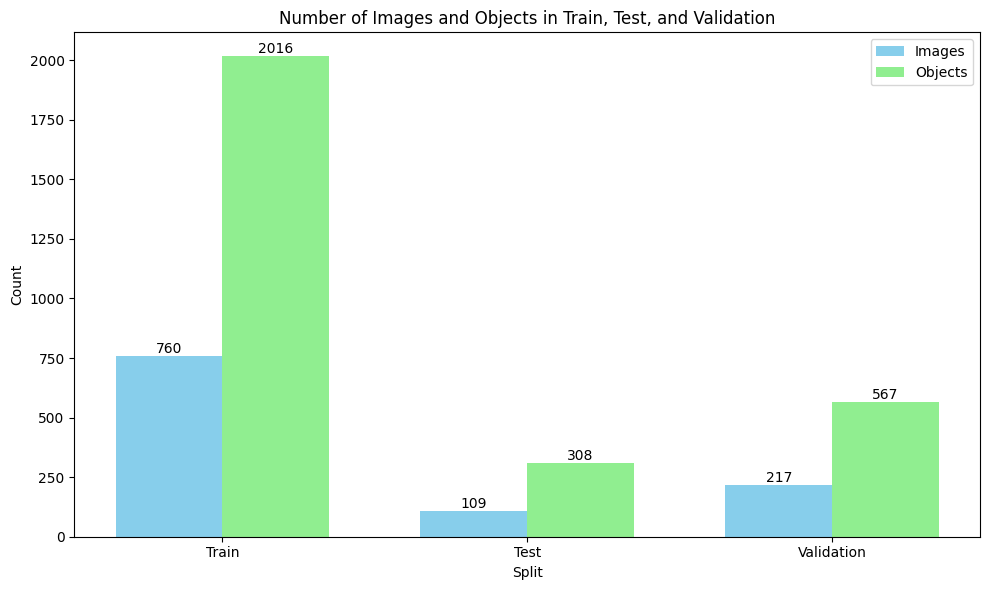

In [32]:
import os
import matplotlib.pyplot as plt

# Set the base directory
base_dir = 'yolo_top_categories'

# Paths to train, test, and validation subdirectories
sub_dirs = {
    'Train': os.path.join(base_dir, 'train'),
    'Test': os.path.join(base_dir, 'test'),
    'Validation': os.path.join(base_dir, 'val')
}

# Initialize dictionaries to store counts
image_counts = {}
object_counts = {}  # Total count of individual objects

# Count images and objects in each subset
for subset, path in sub_dirs.items():
    # Count images
    image_counts[subset] = len([f for f in os.listdir(os.path.join(path, 'images')) if os.path.isfile(os.path.join(path, 'images', f))])

    # Initialize object count
    object_counts[subset] = 0

    # Count objects
    for label_file in os.listdir(os.path.join(path, 'labels')):
        label_path = os.path.join(path, 'labels', label_file)
        if os.path.isfile(label_path):
            with open(label_path, 'r') as f:
                object_counts[subset] += sum(1 for _ in f)  # Counts lines, i.e., objects in the label file

# Plotting the counts for images and objects in train, test, and validation
subsets = list(image_counts.keys())
image_values = list(image_counts.values())
object_values = list(object_counts.values())

plt.figure(figsize=(10, 6))
bar_width = 0.35
index = range(len(subsets))

# Plot bars for images and objects side by side
bars1 = plt.bar(index, image_values, bar_width, label='Images', color='skyblue')
bars2 = plt.bar([i + bar_width for i in index], object_values, bar_width, label='Objects', color='lightgreen')

# Add count labels on top of each bar
for bars in [bars1, bars2]:
    for bar in bars:
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{int(bar.get_height())}',
                 ha='center', va='bottom')

# Labeling
plt.xlabel('Split')
plt.ylabel('Count')
plt.title('Number of Images and Objects in Train, Test, and Validation')
plt.xticks([i + bar_width / 2 for i in index], subsets)
plt.legend()
plt.tight_layout()
plt.show()


In [33]:
# Paths to the original images and labels directories
image_dir = os.path.join(base_dir, 'images')
label_dir = os.path.join(base_dir, 'labels')

# Delete the original images and labels directories
if os.path.exists(image_dir):
    shutil.rmtree(image_dir)

if os.path.exists(label_dir):
    shutil.rmtree(label_dir)

print("Original images and labels directories have been deleted.")

Original images and labels directories have been deleted.


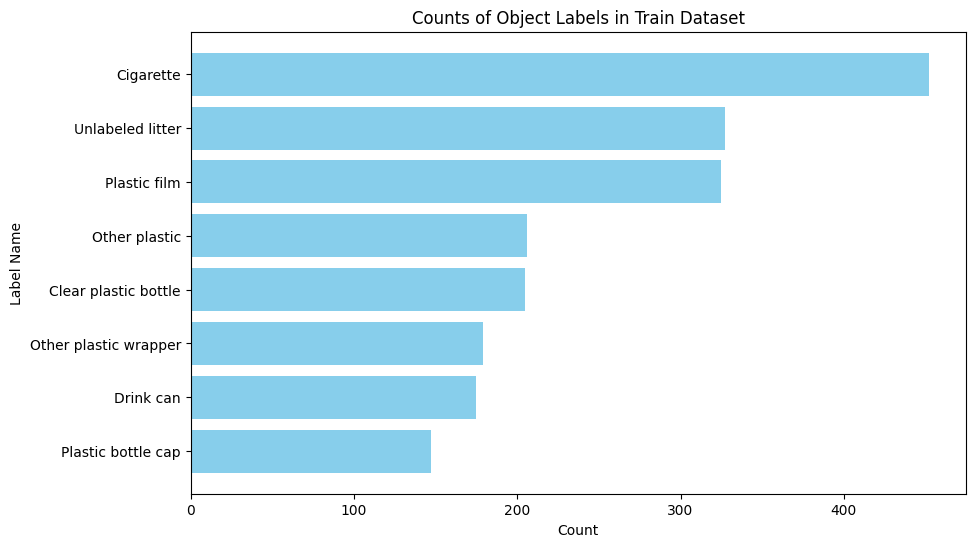

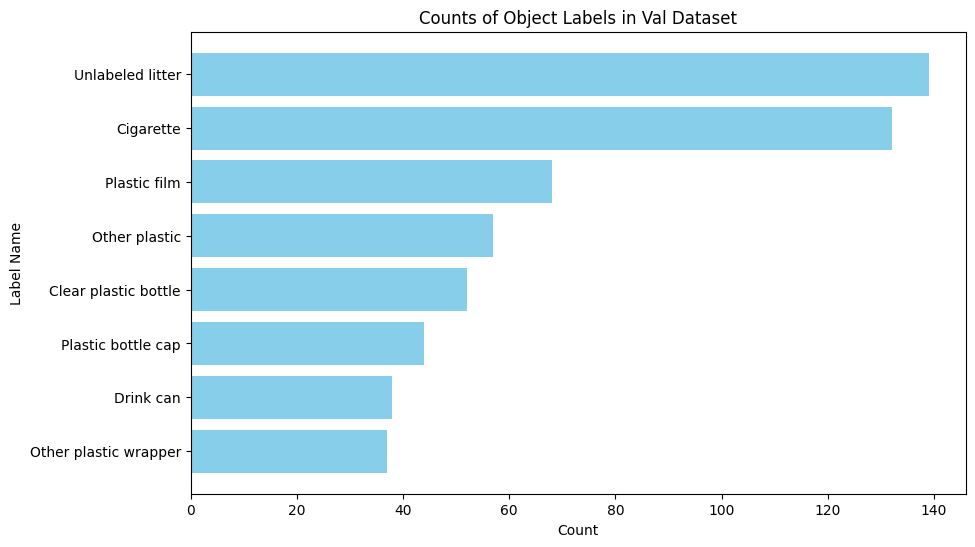

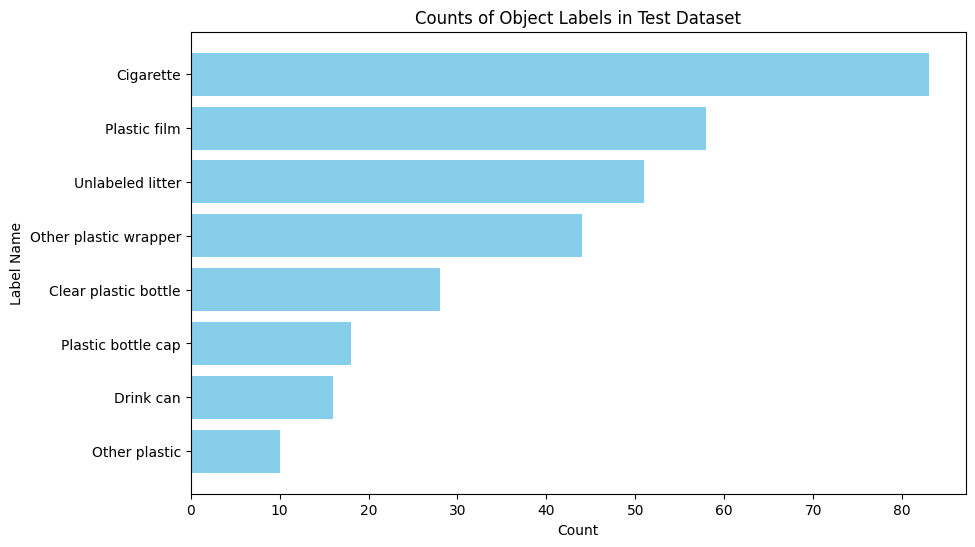

In [34]:
# Function to plot label counts for a given split
def plot_label_counts(split, label_counts):
    # Convert label IDs to label names and sort by count
    labels, counts = zip(*sorted(
        [(label_names[label_id], count) for label_id, count in label_counts.items()],
        key=lambda x: x[1]
    ))

    # Plotting a horizontal bar chart for the split
    plt.figure(figsize=(10, 6))
    plt.barh(labels, counts, color='skyblue')
    plt.xlabel("Count")
    plt.ylabel("Label Name")
    plt.title(f"Counts of Object Labels in {split.capitalize()} Dataset")
    plt.show()

# Loop through each split and calculate label distributions
for split in ['train', 'val', 'test']:
    label_dir_split = os.path.join(base_dir, split, 'labels')

    # Initialize a counter for label counts for the current split
    label_counts = Counter()

    # Loop over each label file in the current label directory
    for label_file in os.listdir(label_dir_split):
        label_file_path = os.path.join(label_dir_split, label_file)

        # Read the label file
        with open(label_file_path, 'r') as file:
            lines = file.readlines()

            # Count each label in the file
            for line in lines:
                parts = line.strip().split()
                label_id = int(parts[0])  # The label ID is the first element
                label_counts[label_id] += 1

    # Plot label counts for the current split
    plot_label_counts(split, label_counts)


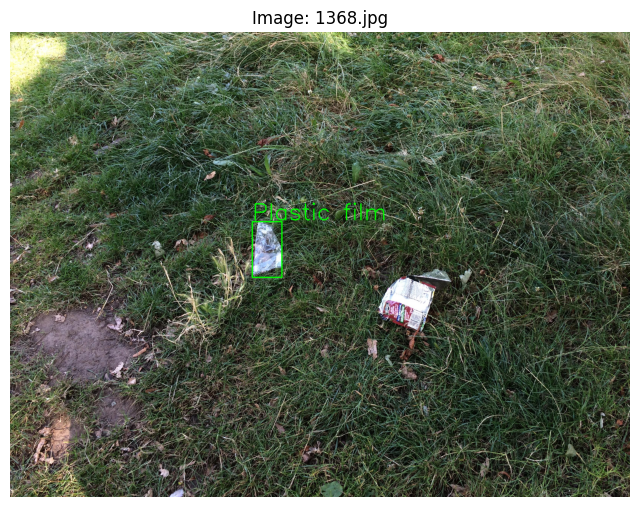

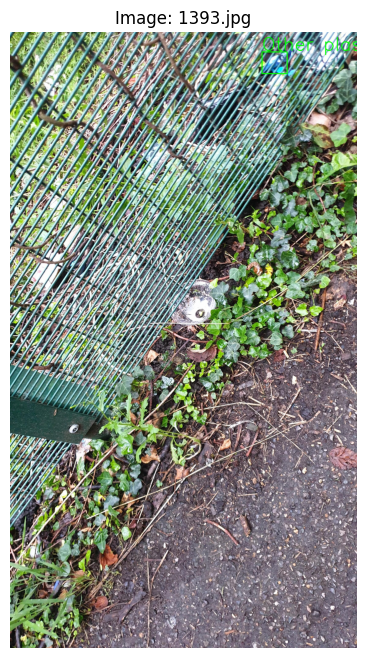

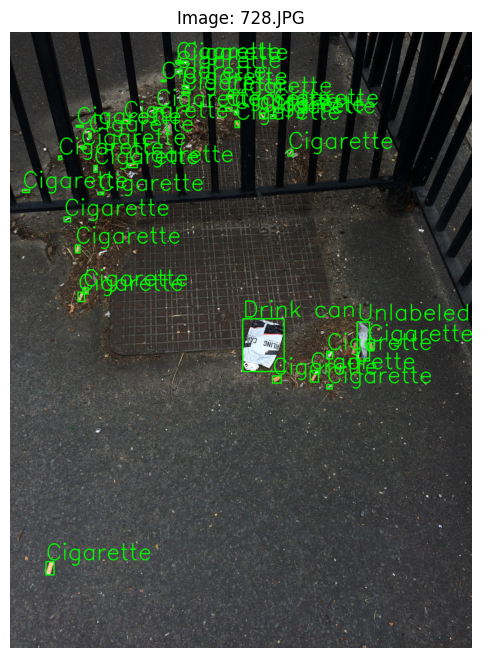

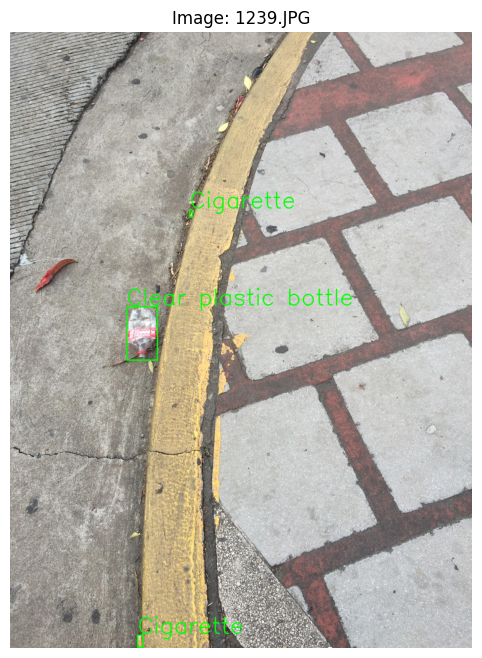

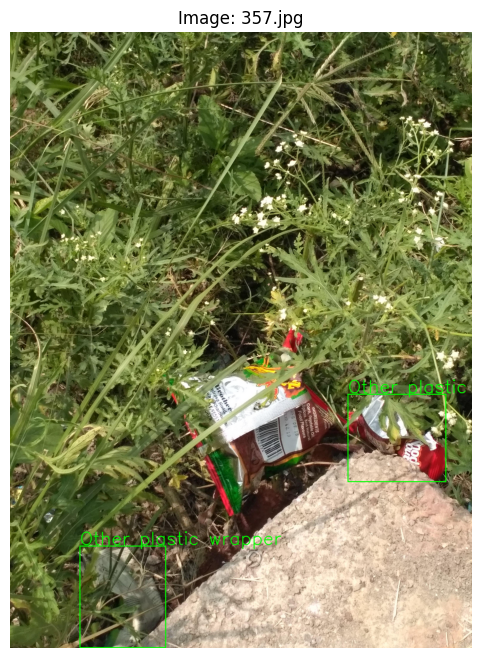

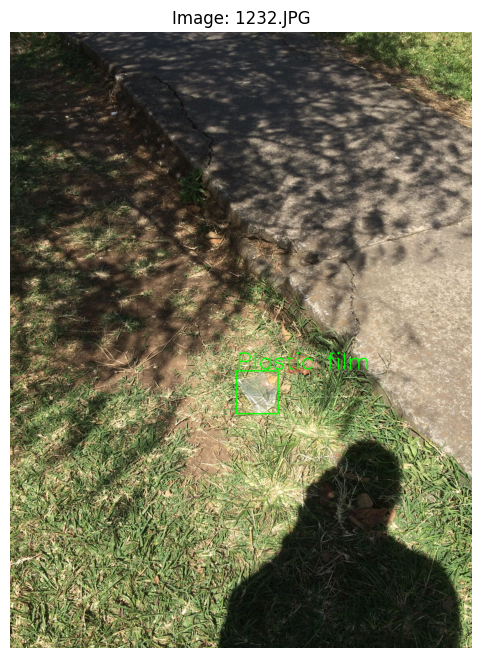

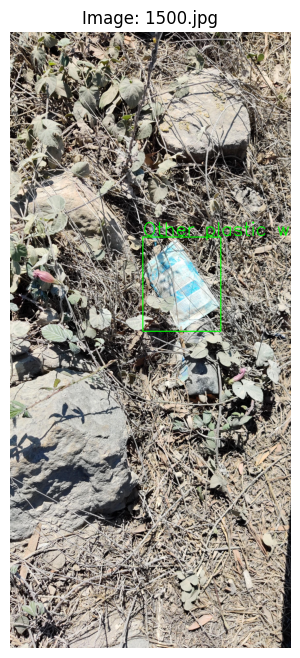

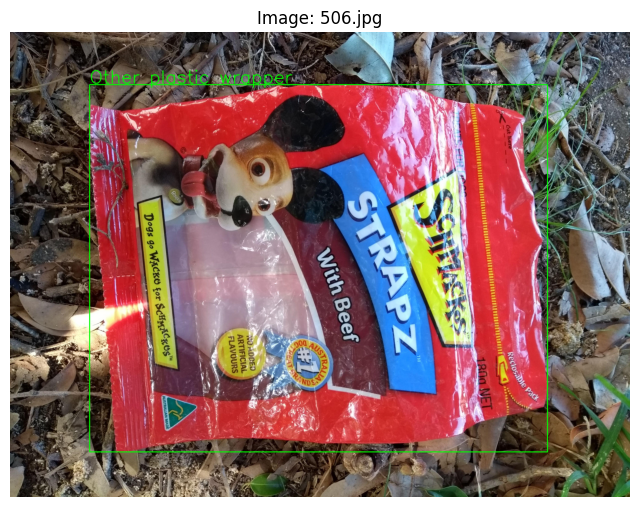

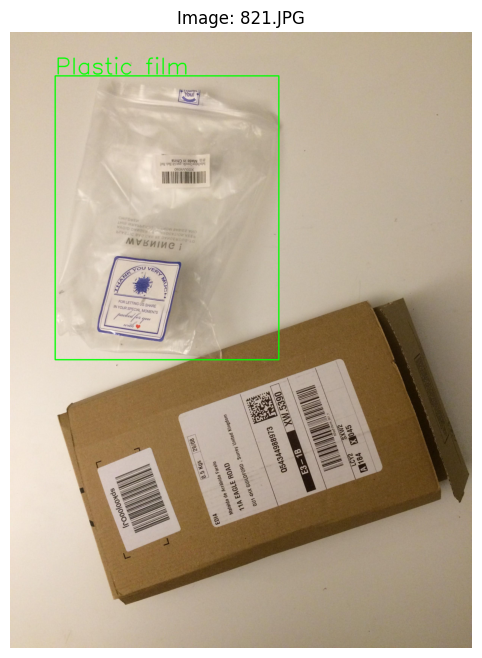

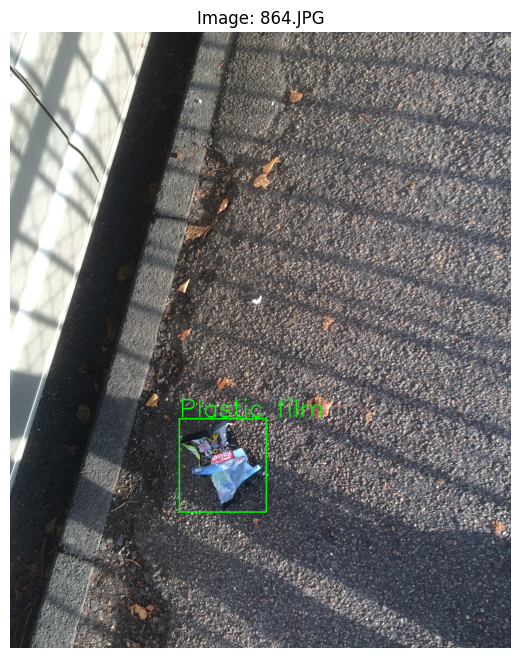

In [35]:
import os
import cv2  # OpenCV is required for this code to run
import matplotlib.pyplot as plt

# Define the class names for each label ID
label_names = {
    0: "Plastic film",
    1: "Unlabeled litter",
    2: "Cigarette",
    3: "Clear plastic bottle",
    4: "Plastic bottle cap",
    5: "Other plastic wrapper",
    6: "Other plastic",
    7: "Drink can"
}

# Paths to the train images and labels directories
train_image_dir = os.path.join(base_dir, 'train', 'images')
train_label_dir = os.path.join(base_dir, 'train', 'labels')

# Define the number of images to display
num_images_to_display = 10

# Get a list of all images in the train set and select the first 10
all_images = [f for f in os.listdir(train_image_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'))]
selected_images = all_images[:num_images_to_display]

# Plot each selected image with bounding boxes
for image_file in selected_images:
    # Load the image
    image_path = os.path.join(train_image_dir, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for matplotlib

    # Load corresponding label file
    label_file = os.path.splitext(image_file)[0] + '.txt'
    label_path = os.path.join(train_label_dir, label_file)

    # Get image dimensions
    height, width, _ = image.shape

    # Read and draw bounding boxes from the label file
    if os.path.exists(label_path):
        with open(label_path, 'r') as file:
            for line in file:
                parts = line.strip().split()
                class_id = int(parts[0])  # The label ID
                x_center, y_center, box_width, box_height = map(float, parts[1:])

                # Convert YOLO format to pixel coordinates
                x1 = int((x_center - box_width / 2) * width)
                y1 = int((y_center - box_height / 2) * height)
                x2 = int((x_center + box_width / 2) * width)
                y2 = int((y_center + box_height / 2) * height)

                # Draw the bounding box on the image
                color = (0, 255, 0)  # Green color for bounding box
                thickness = 5  # Thickness of the bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)

                # Get the label name from the dictionary
                label_text = label_names.get(class_id, "Unknown")

                # Set the font scale for the text
                font_scale = 4
                cv2.putText(image, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, thickness)

    # Display the image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image: {image_file}")
    plt.show()

In [36]:
import os

# Directories for each split
splits = ['train', 'val', 'test']
total_objects = 0
total_images = 0

# Loop through each split directory
for split in splits:
    image_dir = os.path.join(base_dir, split, 'images')
    label_dir = os.path.join(base_dir, split, 'labels')

    # Process each image in the current split
    for image_file in os.listdir(image_dir):
        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(label_dir, label_file)

        # Check if the corresponding label file exists
        if os.path.exists(label_path):
            total_images += 1  # Increment image count
            with open(label_path, 'r') as file:
                # Count the number of lines (objects) in the label file
                object_count = sum(1 for line in file)
                total_objects += object_count

# Calculate the average number of objects per image
average_objects_per_image = total_objects / total_images if total_images > 0 else 0

print(f"Total number of images: {total_images}")
print(f"Total number of objects: {total_objects}")
print(f"Average number of objects per image: {average_objects_per_image:.2f}")

Total number of images: 1086
Total number of objects: 2891
Average number of objects per image: 2.66
